In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return f"{h}:{m:>02}:{s:>05.2f}"

## Read the Data from H5 file. (all inputs are already scaled)

In [4]:
h5file = h5py.File('/content/drive/MyDrive/Finally training Data/Finally_Training_dataHS_10265_not_scaled_all2.61.h5', 'r' )

OSError: ignored

In [ ]:
xyfornotscaled = np.array(h5file['Training data not scaled/xyfornotscaled'])
label = np.array(h5file['Training data not scaled/Labels'])
print(xyfornotscaled.shape)
print(label.shape)
h5file.close()

(10265, 272, 101, 3)
(10265, 6)


In [ ]:
Realdata1 = np.load('/content/drive/MyDrive/Trainning data/test_data_daniel_Mirijam.npz.npy')
Realdata2 = np.load('/content/drive/MyDrive/Trainning data/test_data_daniel_Mirijam2.npz.npy')
print(Realdata1.shape)
print(Realdata2.shape)
Realdata1[:,:,2] *= 0.001
Realdata2[:,:,2] *= 0.001
#Realdata1[:,:,2] /= 2.61
#Realdata2[:,:,2] /= 2.61
Realdata1 = np.tile(Realdata1,(5,1,1,1))
Realdata2 = np.tile(Realdata2,(5,1,1,1))
print(Realdata1.shape)
print(Realdata2.shape)
xyfornotscaled = np.concatenate((xyfornotscaled, Realdata1), axis=0)
xyfornotscaled = np.concatenate((xyfornotscaled, Realdata2), axis=0)
print(xyfornotscaled.shape)

(272, 101, 3)
(272, 101, 3)
(5, 272, 101, 3)
(5, 272, 101, 3)
(10275, 272, 101, 3)


# Scalling the Input and the outpts

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
xyfornotscaledtrained = xyfornotscaled[0:10000,:,0:43,2]
predictionnotscaled   = xyfornotscaled[10000:10150,:,0:43,2]
realdata2notscaled     = xyfornotscaled[10270:10275,:,0:43,2]
XYFORnotscaled      = xyfornotscaledtrained.reshape((10000, 272*43))
Predictionnotscaled = predictionnotscaled.reshape((150, 272*43))
Realdata2notscaled  = realdata2notscaled.reshape((5, 272*43))
scaler.fit(XYFORnotscaled)
xyforscaled  = scaler.transform(XYFORnotscaled)
predictionscaled  = scaler.transform(Predictionnotscaled)
realdata2scaled = scaler.transform(Realdata2notscaled)
xyfor  = xyforscaled.reshape((10000,272,43,1))
predictions  = predictionscaled.reshape((150,272,43,1))
realdata2  = realdata2scaled.reshape((5,272,43,1))
print(xyfor.shape)
print(predictions.shape)
print(realdata2.shape)

(10000, 272, 43, 1)
(150, 272, 43, 1)
(5, 272, 43, 1)


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(label[0:10000,:])
labelscaled = scaler.transform(label[0:10000,:])
labelpredictionscaled = scaler.transform(label[10000:10150,:])
print(labelscaled[8000:8005,:])

[[0.8   0.8   0.8   0.375 0.2   0.2  ]
 [0.6   1.    0.2   0.75  0.2   1.   ]
 [0.6   1.    0.2   0.    0.8   0.8  ]
 [0.    0.2   1.    0.75  0.    0.6  ]
 [0.    0.8   0.2   0.375 0.8   0.4  ]]


# Splitting the Data

In [ ]:
X_train = xyfor[:8000,:,:]
Y_train = labelscaled [:8000,:]
X_test  = xyfor[8000:10000,:,:]
Y_test  = labelscaled [8000:10000,:]
X_predict = predictions
Y_predict = labelpredictionscaled
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)
print(X_predict.shape)
print(Y_predict.shape)
#print(X_train[0])

(8000, 272, 43, 1)
(8000, 6)
(2000, 272, 43, 1)
(2000, 6)
(150, 272, 43, 1)
(150, 6)


In [ ]:
import tensorflow as tf
import datetime

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/ 

# CNN neural network with  for regression

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow import keras
import time

model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 272x101 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(272, 43, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='PReLU'),
    tf.keras.layers.Dense(256, activation='PReLU'),
    tf.keras.layers.Dense(64, activation='PReLU'),
    tf.keras.layers.Dense(32, activation='PReLU'),
    tf.keras.layers.Dense(6)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 270, 41, 64)       640       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 135, 20, 64)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 133, 18, 64)       36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 66, 9, 64)        0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 38016)             0         
                                                                 
 dense (Dense)               (None, 512)               1

In [ ]:
model.compile(optimizer='Adamax', loss='mse', metrics=['mae'])

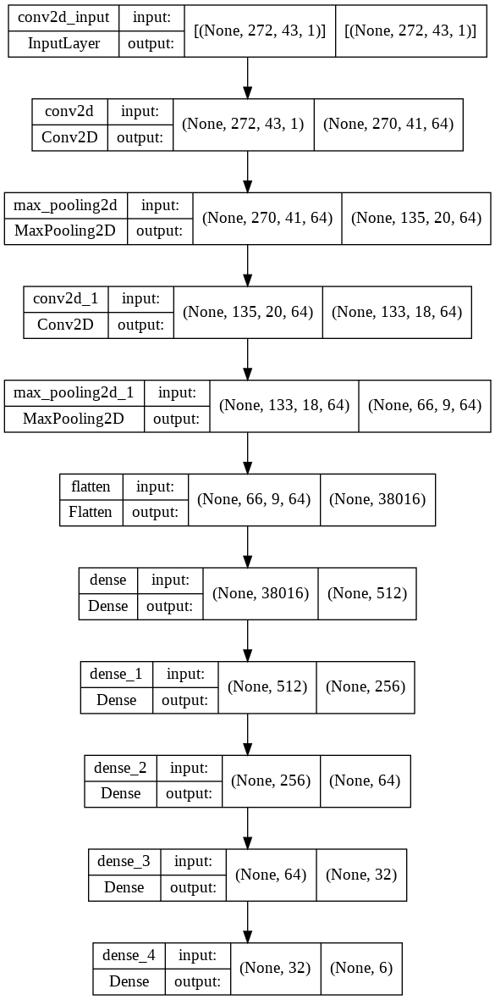

In [ ]:
keras.utils.plot_model(model, "one node NN.png", show_shapes=True)

In [ ]:
model.compile(optimizer='Adamax', loss='mse', metrics=['mae'])

In [ ]:
start_time = time.time()
history = model.fit(X_train, Y_train, verbose = 1, validation_split=0.2, epochs=1600, batch_size=10)

elapsed_time = time.time() - start_time
print("Elapsed time: {}".format(hms_string(elapsed_time)))

Epoch 1/1600
640/640 [==============================] - 15s 8ms/step - loss: 0.0883 - mae: 0.2364 - val_loss: 0.0855 - val_mae: 0.2270
Epoch 2/1600
640/640 [==============================] - 5s 7ms/step - loss: 0.0790 - mae: 0.2223 - val_loss: 0.0731 - val_mae: 0.2109
Epoch 3/1600
640/640 [==============================] - 5s 8ms/step - loss: 0.0697 - mae: 0.2055 - val_loss: 0.0641 - val_mae: 0.1964
Epoch 4/1600
633/640 [============================>.] - ETA: 0s - loss: 0.0642 - mae: 0.1943

KeyboardInterrupt: ignored

In [ ]:
model.evaluate(X_test, Y_test)

In [ ]:
# we get a sample data (the first 2 inputs from the training data)
to_predict = X_predict[0:150]
# we call the predict method
predictions = model.predict(to_predict)
predictions=np.around(predictions, decimals=4)

# print the predictions
print(predictions[0:5,:])
print()
print(Y_predict[0:5])

In [ ]:
predictionsinv = scaler.inverse_transform(predictions)
Y_predictinv = scaler.inverse_transform(Y_predict)
predictionsinv=np.around(predictionsinv, decimals=2)
# print the predictions

print('        predictions values')
print('   E','   PR','   A','   B','   C','   N')
print(predictionsinv[10:15,:])
print()
print('          original values')
print('   E','   PR','   A','   B','   C','   N')
print(Y_predictinv[10:15,:])

        predictions values
   E    PR    A    B    C    N
[[2.59 0.37 0.19 0.05 0.41 0.66]
 [2.1  0.41 0.12 0.04 0.52 0.89]
 [2.61 0.39 0.16 0.01 0.65 0.69]
 [2.21 0.37 0.18 0.06 0.97 0.99]
 [2.19 0.41 0.13 0.04 0.43 0.66]]

          original values
   E    PR    A    B    C    N
[[2.6  0.37 0.2  0.06 0.3  0.62]
 [2.1  0.41 0.12 0.03 0.3  0.86]
 [2.6  0.39 0.16 0.01 0.7  0.74]
 [2.2  0.37 0.18 0.06 0.9  0.98]
 [2.2  0.41 0.12 0.03 0.5  0.74]]


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
xyfornotscaledtrained = xyfornotscaled[0:10150,:,0:43,2]
realdatanotscaled = xyfornotscaled[10270:10275,:,0:43,2]
XYFORnotscaled  = xyfornotscaledtrained.reshape((10150, 272*43))
Realdatanotscaled  = realdatanotscaled.reshape((5, 272*43))
scaler.fit(XYFORnotscaled)
xyforscaled  = scaler.transform(XYFORnotscaled)
realdatscaled = scaler.transform(Realdatanotscaled)
xyfor  = xyforscaled.reshape((10150,272,43,1))
realdata = realdatscaled.reshape((5,272,43,1))
print(xyfor.shape)

(10150, 272, 43, 1)


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(label[0:10150,:])
label = scaler.transform(label[0:10150,:])
print(label[8000:8005,:])

[[0.8   0.8   0.8   0.375 0.2   0.2  ]
 [0.6   1.    0.2   0.75  0.2   1.   ]
 [0.6   1.    0.2   0.    0.8   0.8  ]
 [0.    0.2   1.    0.75  0.    0.6  ]
 [0.    0.8   0.2   0.375 0.8   0.4  ]]


In [ ]:
# we get a sample data (the first 2 inputs from the training data)
to_predict = realdata
# we call the predict method
predictions = model.predict(to_predict)
predictions=np.around(predictions, decimals=4)

# print the predictions
print(predictions[0:5,:])


[[ 0.2809  1.0892 -0.1694  0.4308 -0.1141 -0.1856]
 [ 0.2809  1.0892 -0.1694  0.4308 -0.1141 -0.1856]
 [ 0.2809  1.0892 -0.1694  0.4308 -0.1141 -0.1856]
 [ 0.2809  1.0892 -0.1694  0.4308 -0.1141 -0.1856]
 [ 0.2809  1.0892 -0.1694  0.4308 -0.1141 -0.1856]]


In [ ]:
predictionsinv = scaler.inverse_transform(predictions)
#Y_predictinv = scaler.inverse_transform(Y_predict)
predictionsinv=np.around(predictionsinv, decimals=2)
# print the predictions

print('        predictions values')
print('   E','   PR','   A','   B','   C','   N')
print(predictionsinv[0:5,:])
print()
#print('          original values')
#print('   E','   PR','   A','   B','   C','   N')
#print(Y_predictinv[10:15,:])

        predictions values
   E    PR    A    B    C    N
[[ 0.28  1.09 -0.17  0.43 -0.11 -0.19]
 [ 0.28  1.09 -0.17  0.43 -0.11 -0.19]
 [ 0.28  1.09 -0.17  0.43 -0.11 -0.19]
 [ 0.28  1.09 -0.17  0.43 -0.11 -0.19]
 [ 0.28  1.09 -0.17  0.43 -0.11 -0.19]]



# Plotting to compare between the predicted Value and original Value (what it should be)

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Tensorboard/CNN20220110-192612

<IPython.core.display.Javascript object>

In [ ]:
print(predictionsinv.shape)
print(Y_predictinv.shape)

(150, 6)
(150, 6)


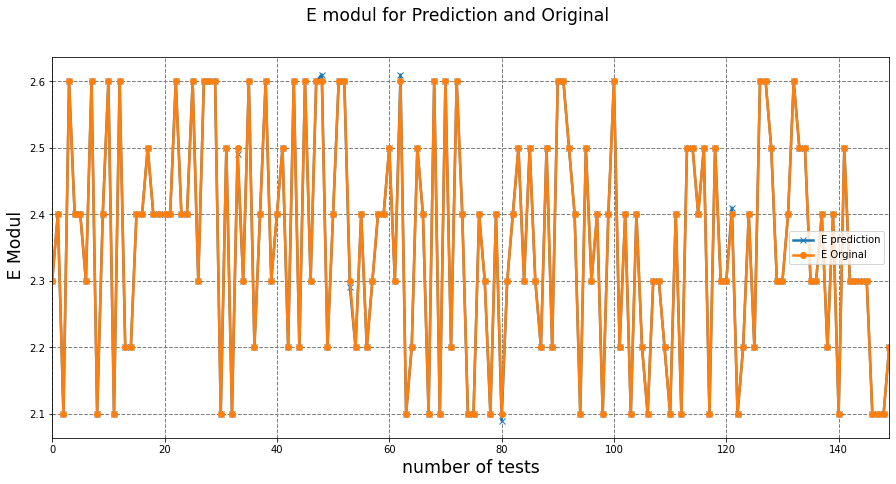

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,0]
y2 = Y_predictinv[:,0]

### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='E prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='E Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' E Modul',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle( 'E modul for Prediction and Original',fontsize='xx-large' )
plt.show()

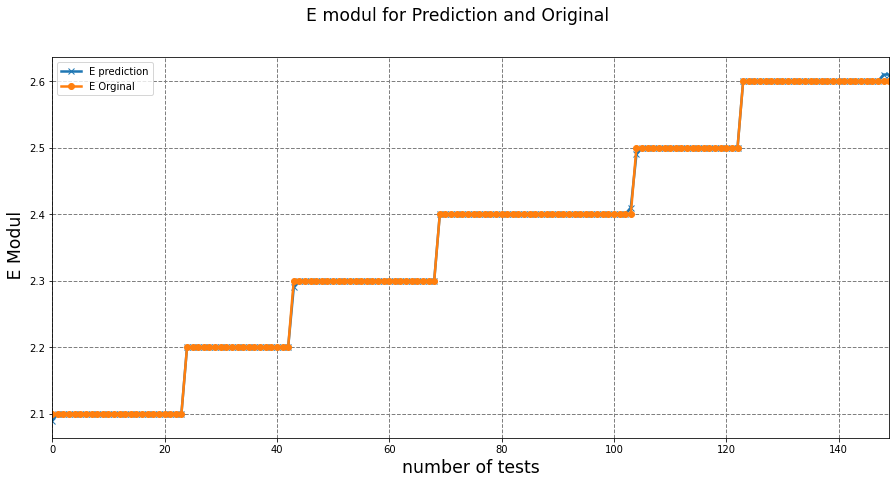

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,0]
y2 = Y_predictinv[:,0]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='E prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='E Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' E Modul',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle( 'E modul for Prediction and Original',fontsize='xx-large' )
plt.show()

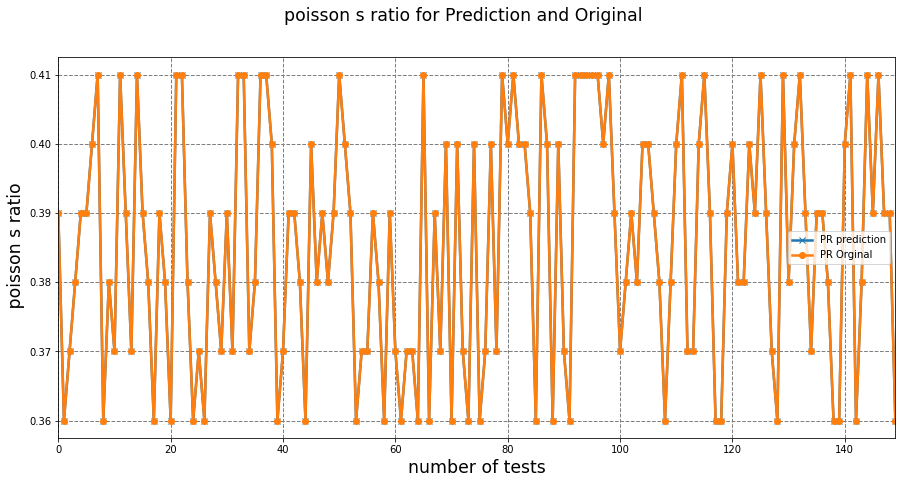

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,1]
y2 = Y_predictinv[:,1]
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='PR prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='PR Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' poisson s ratio',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle( 'poisson s ratio for Prediction and Original',fontsize='xx-large' )
plt.show()

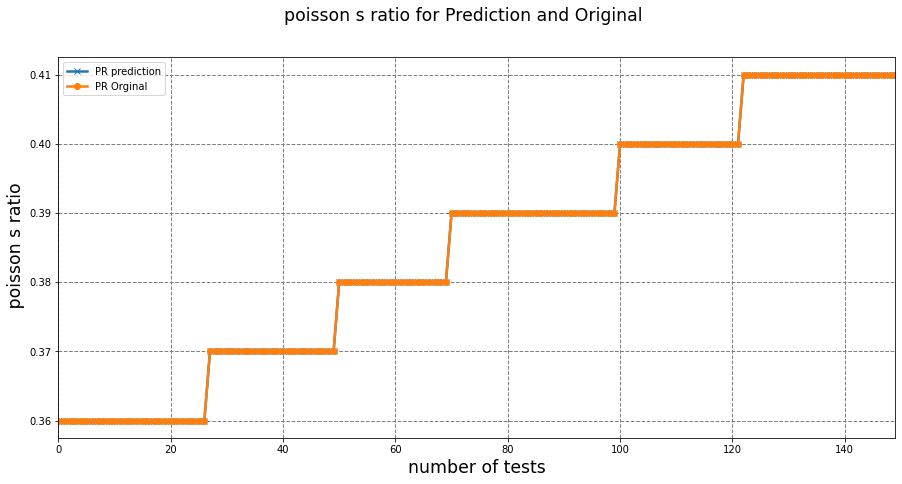

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,1]
y2 = Y_predictinv[:,1]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='PR prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='PR Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' poisson s ratio',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle( 'poisson s ratio for Prediction and Original',fontsize='xx-large' )
plt.show()

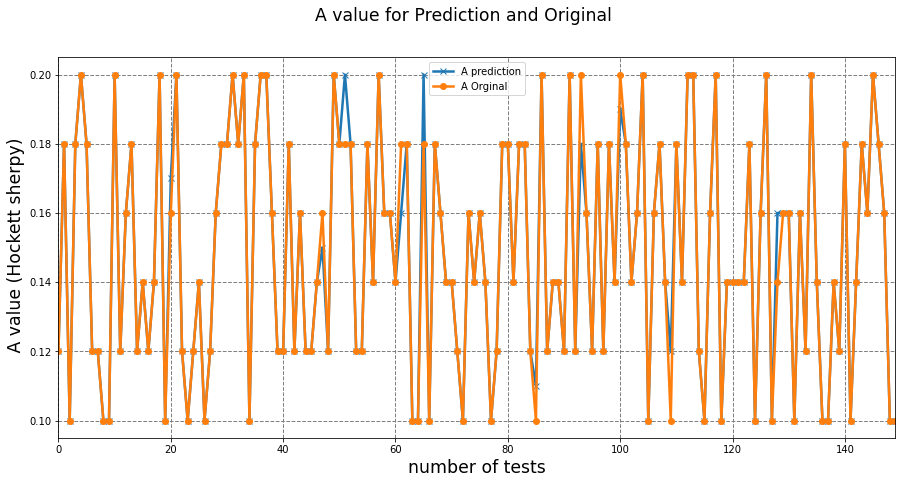

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,2]
y2 = Y_predictinv[:,2]
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='A prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='A Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' A value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('A value for Prediction and Original',fontsize='xx-large' )
plt.show()

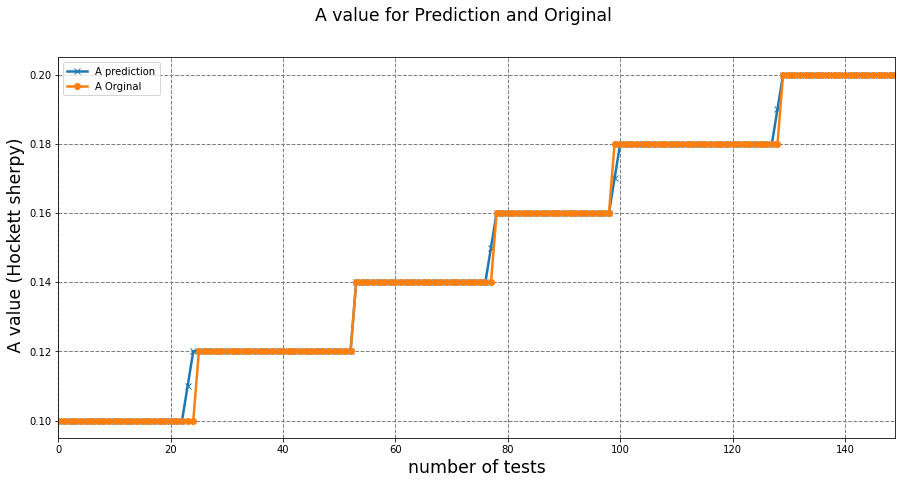

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,2]
y2 = Y_predictinv[:,2]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='A prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='A Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' A value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('A value for Prediction and Original',fontsize='xx-large' )
plt.show()

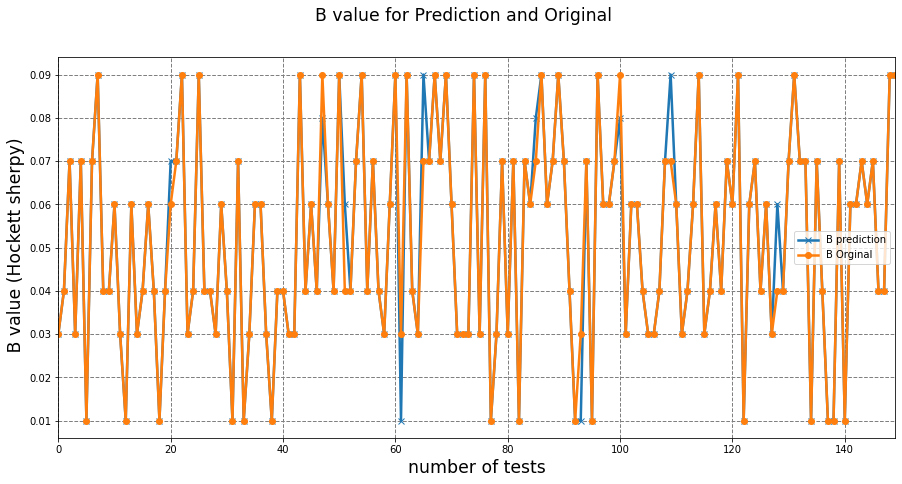

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,3]
y2 = Y_predictinv[:,3]
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='B prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='B Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' B value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('B value for Prediction and Original',fontsize='xx-large' )
plt.show()

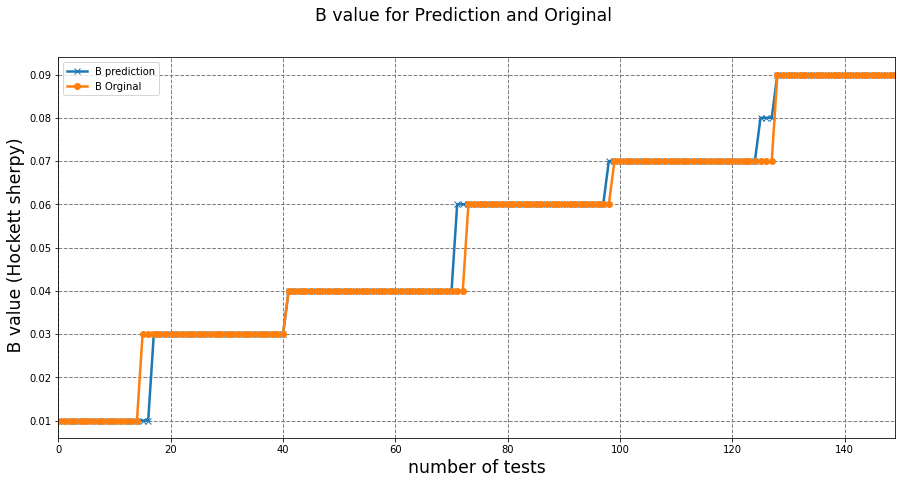

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,3]
y2 = Y_predictinv[:,3]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='B prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='B Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' B value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('B value for Prediction and Original',fontsize='xx-large' )
plt.show()

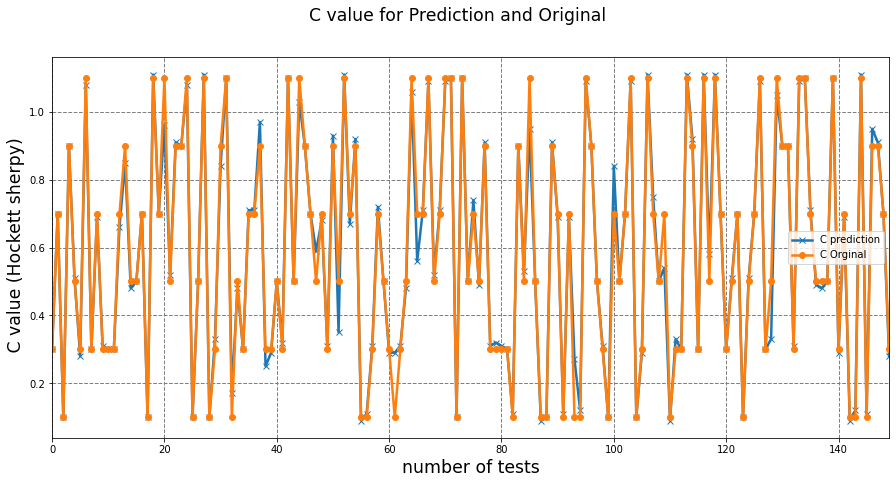

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,4]
y2 = Y_predictinv[:,4]
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='C prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='C Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' C value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('C value for Prediction and Original',fontsize='xx-large' )
plt.show()

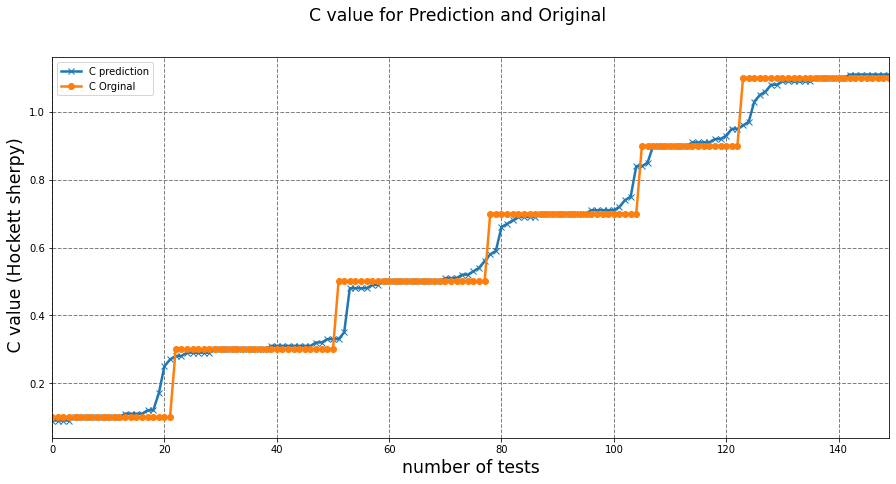

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,4]
y2 = Y_predictinv[:,4]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='C prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='C Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' C value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('C value for Prediction and Original',fontsize='xx-large' )
plt.show()

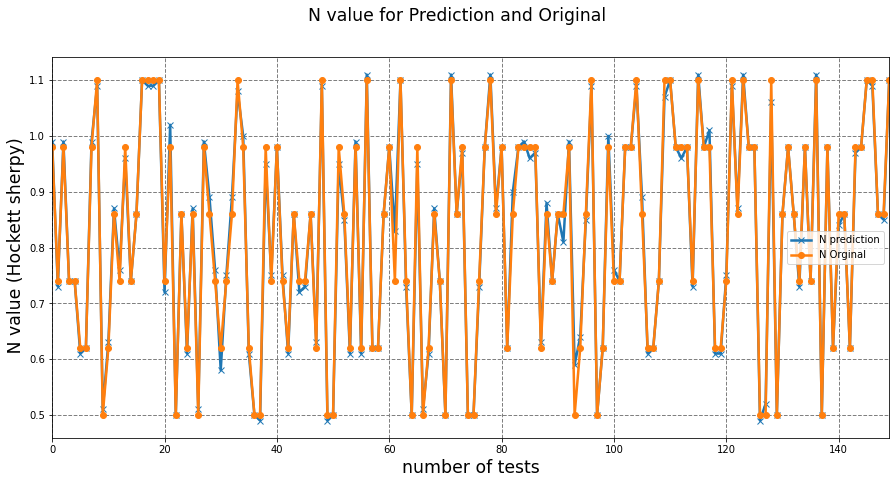

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,5]
y2 = Y_predictinv[:,5]
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='N prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='N Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' N value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('N value for Prediction and Original',fontsize='xx-large' )
plt.show()

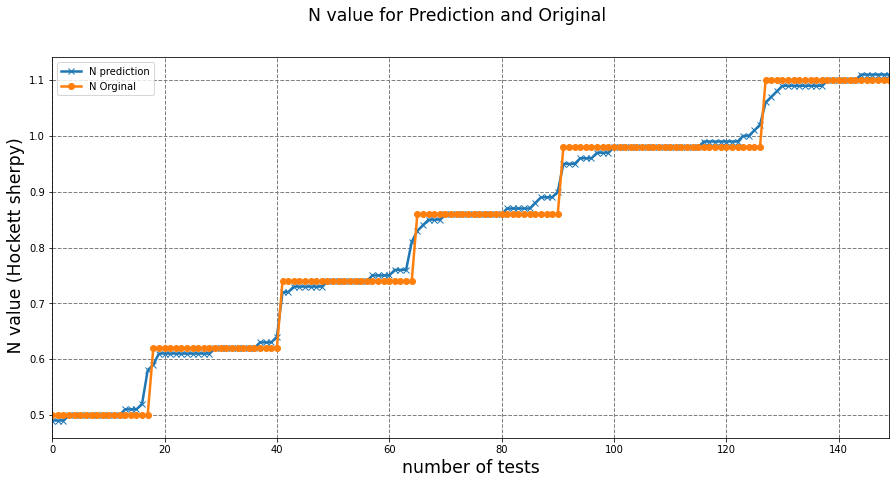

In [ ]:
x  = np.arange(150)
y1 = predictionsinv[:,5]
y2 = Y_predictinv[:,5]
y1 = np.sort(y1)
y2 = np.sort(y2)
### Using plt.xxx functions
plt.figure(figsize=(15,7))
plt.plot(x, y1, lw=2.5 , label='N prediction',marker='x')
plt.plot(x, y2, lw=2.5 , label='N Orginal',marker='o')

plt.xlim( x.min(), x.max())
plt.xlabel( 'number of tests',fontsize='xx-large')
plt.ylabel( ' N value (Hockett sherpy)',fontsize='xx-large' )
plt.grid( ls='--', color='gray', linewidth=1 )
plt.legend()
plt.suptitle('N value for Prediction and Original',fontsize='xx-large' )
plt.show()

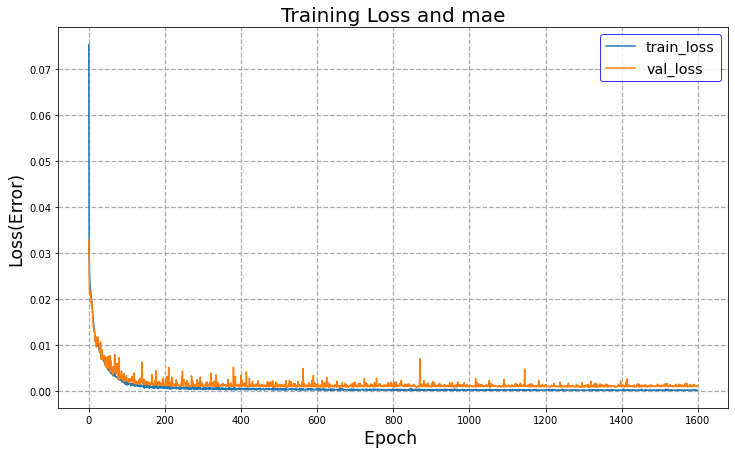

In [ ]:
#plt.style.use("ggplot")
plt.figure(figsize=(12,7))
plt.plot(history.history["loss"], label="train_loss",lw=1.5)
plt.plot(history.history["val_loss"], label="val_loss",lw=1.5)
#plt.plot(history.history["mae"], label="train_mae",lw=1.5)
#plt.plot(history.history["val_mae"], label="val_mae",lw=1.5)
plt.title("Training Loss and mae",fontsize=20)
plt.xlabel("Epoch ",fontsize='xx-large')
plt.ylabel("Loss(Error)",fontsize='xx-large')
plt.legend(edgecolor='blue',fontsize='x-large')
plt.grid(ls='--', color='#AAAAAA',linewidth=1.25 )
#plt.savefig(args["output"])

In [ ]:
model.save("/content/drive/MyDrive/Colab Notebooks/10150CNN1600epochAdamxscaledonlyforce")

In [ ]:
model = keras.models.load_model("/content/drive/MyDrive/Colab Notebooks/10150CNN1600epochAdamxscaledonlyforce")